In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Carga de los datos

In [2]:
# Cargar los datos
csv_file_path = r"../../data/limpieza/cleaned_data.csv"
df = pd.read_csv(csv_file_path)

#No usar las tendencias futuras, ni los indices ya que no aporta información al modelo
vars_validas = [v for v in df.columns if v not in ['tendencia_futura_7d', 'tendencia_futura_30d', 'Unnamed: 0', 'timestamp']]

df = df[vars_validas]

# Vistazo inicial con todas las variables

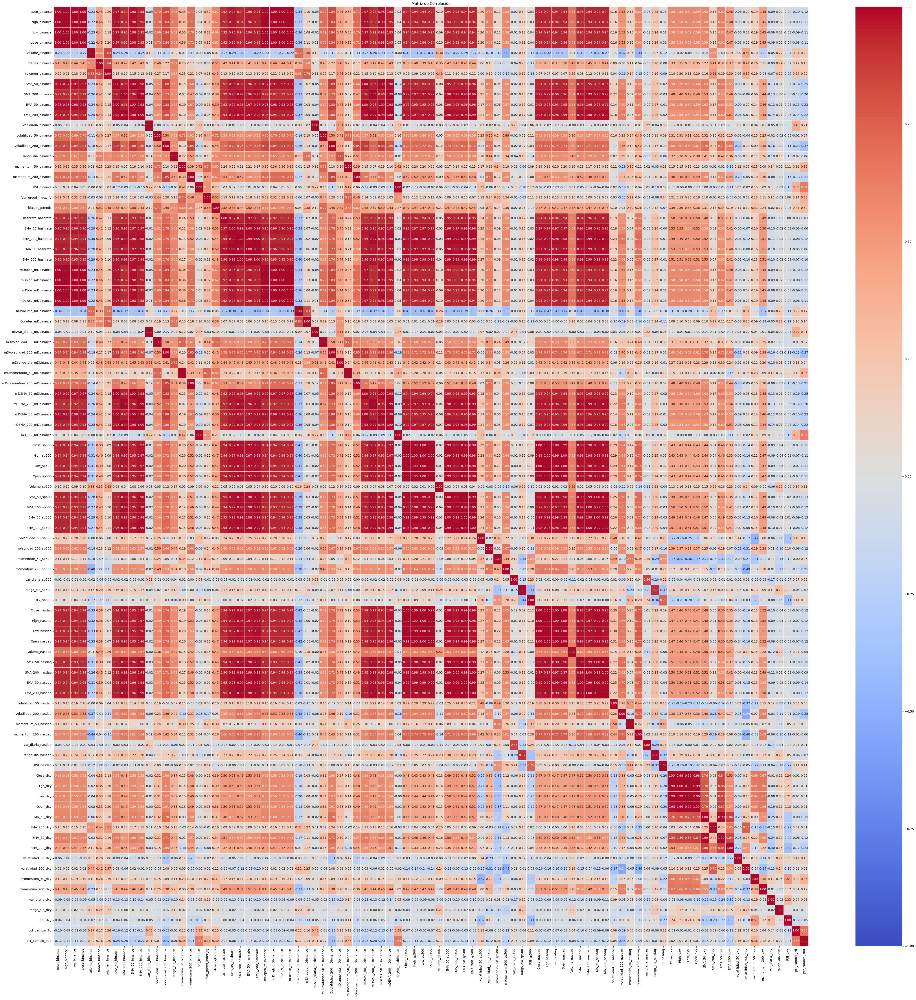

In [3]:
# Calcular la matriz de correlación
corr = df.corr()

# Ajustar tamaño del gráfico dinámicamente
fig_width = max(12, len(corr.columns) * 0.5)
fig_height = max(12, len(corr.columns) * 0.5)

# Graficar heatmap completo
plt.figure(figsize=(fig_width, fig_height))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f",
            linewidths=0.5, cbar=True, center=0, vmin=-1, vmax=1)

# Estética
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.title("Matriz de Correlación")

plt.tight_layout()
plt.show()

**Observación**: Al explorar el conjunto de datos, podemos detectar un alto grado de correlación entre muchas variables predictoras, especialmente dentro de grupos que representan fenómenos similares (por ejemplo, precios diarios o medias móviles). Por ello decidimos eliminar variables del conjunto de datos para evitar esta autocorrelación.

# Estrategia 1: Eliminación mecánica por correlación

## Selección de las variables altamente correlacionadas

In [4]:
# Crear la matriz de correlación sin incluir las variables respuesta
corr_matrix = df.iloc[:, :-2].corr().abs()

# Seleccionar variables con correlación > 0.9
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Encuentra las columnas que tienen una correlación mayor a 0.9
variables_a_eliminar = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
print(f"Variables eliminadas por alta correlación: {variables_a_eliminar}")

# Escoger las variables que no tengan una correlacion mayor a 0.9
variables_predictoras = [col for col in df.columns if col not in variables_a_eliminar]
print(f"Variables resultantes: {list(variables_predictoras)}")

Variables eliminadas por alta correlación: ['high_binance', 'low_binance', 'close_binance', 'SMA_50_binance', 'SMA_200_binance', 'EMA_50_binance', 'EMA_200_binance', 'hashrate_hashrate', 'SMA_50_hashrate', 'SMA_200_hashrate', 'EMA_50_hashrate', 'EMA_200_hashrate', 'mDopen_mDbinance', 'mDhigh_mDbinance', 'mDlow_mDbinance', 'mDclose_mDbinance', 'mDvar_diaria_mDbinance', 'mDvolatilidad_50_mDbinance', 'mDvolatilidad_200_mDbinance', 'mDmomentum_50_mDbinance', 'mDmomentum_200_mDbinance', 'mDSMA_50_mDbinance', 'mDSMA_200_mDbinance', 'mDEMA_50_mDbinance', 'mDEMA_200_mDbinance', 'mD_RSI_mDbinance', 'Close_sp500', 'High_sp500', 'Low_sp500', 'Open_sp500', 'SMA_50_sp500', 'SMA_200_sp500', 'EMA_50_sp500', 'EMA_200_sp500', 'Close_nasdaq', 'High_nasdaq', 'Low_nasdaq', 'Open_nasdaq', 'SMA_50_nasdaq', 'SMA_200_nasdaq', 'EMA_50_nasdaq', 'EMA_200_nasdaq', 'rango_dia_nasdaq', 'High_dxy', 'Low_dxy', 'Open_dxy', 'EMA_50_dxy']
Variables resultantes: ['open_binance', 'volume_binance', 'trades_binance', 'volum

**Análisis**: Una vez definidos los grupos y seleccionadas las variables representativas, observamos una reducción significativa en las correlaciones del conjunto de datos. No obstante, persistían algunas correlaciones elevadas, especialmente entre los precios y las medias móviles del Nasdaq y del mercado de derivados de Binance. Dado que la media móvil del mercado de derivados mostraba la mayor correlación con la variable objetivo —lo cual es coherente, ya que representa directamente el comportamiento del propio Bitcoin—, optamos por conservar esta variable y eliminar las demás. Esta decisión nos permitió reducir correlaciones superiores a 0.92 y construir un conjunto de variables más compacto y con menor riesgo de colinealidad.

## Visualización de las correlaciones con el nuevo conjunto de variables

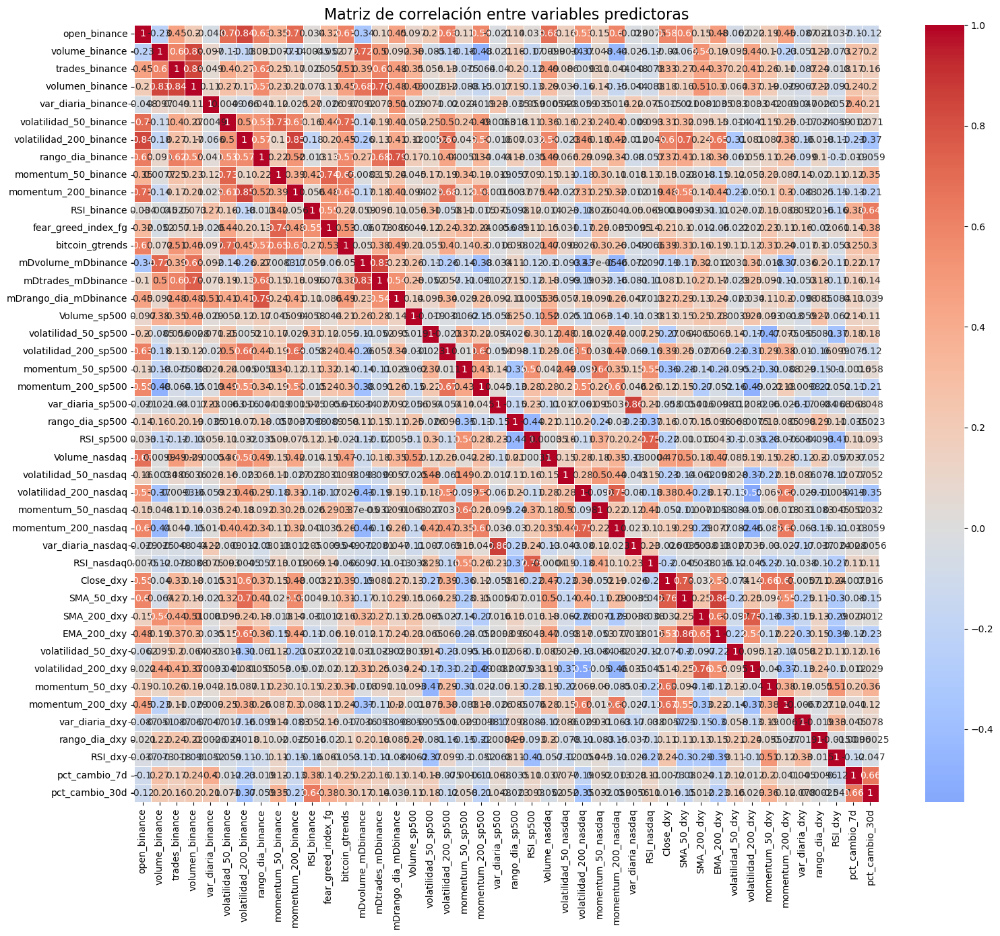

In [5]:
# Calcular matriz de correlación
corr_matrix = df[variables_predictoras].corr()

# Dibujar heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Matriz de correlación entre variables predictoras', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


**Análisis**: Para eliminar esta autocorrelación, se identificaron pares de variables con una correlación absoluta superior a 0.9 y se eliminó una de cada par de forma sistemática. Este procedimiento permitió reducir la colinealidad entre variables y simplificar el conjunto de datos. Sin embargo, al revisar manualmente las variables restantes, se evidenció que muchas de las eliminadas aportaban información clave para comprender la dinámica del mercado. En algunos casos, el enfoque automático eliminaba todas las variables pertenecientes a una misma familia de indicadores, como las medias móviles asociadas al precio del bitcoin, dejando al conjunto de datos sin ningún representante de esa dimensión analítica, y comprometiendo así la diversidad informativa del modelo. Así, quedó claro que el enfoque mecánico, aunque útil desde el punto de vista estadístico, no diferenciaba entre redundancia técnica y valor analítico. Esta limitación motivó un replanteamiento de la estrategia, buscando un enfoque más reflexivo que equilibrara la reducción de redundancias con la conservación del contenido informativo más relevante.

# Estrategia 2: Selección informada por agrupación temática

**Explicación de la nueva estrategia**: Agrupar las variables en función del tipo de información que aportan —por ejemplo, precios diarios, medias móviles, volatilidad, momentum, indicadores de sentimiento o métricas del mercado de derivados—. Estos grupos, son conjuntos de variables altamente correlacionadas entre sí, que comparten un mismo significado. Dentro de cada grupo, seleccionamos una variable representativa, eligiendo aquellas que estén más correlacionadas con la variable objetivo. De esta forma, pretendemos evitar la redundancia interna en cada grupo, conservando únicamente aquellas variables que, además de aportar información única, tienen mayor potencial explicativo para el modelo de predicción. Este proceso permitió construir un conjunto de variables más compacto, informativo y estadísticamente robusto.

## Creación de los grupos

In [6]:
grupos = {
    'precios_binance': ['open_binance', 'high_binance', 'low_binance', 'close_binance', 'mDopen_mDbinance', 'mDhigh_mDbinance', 'mDlow_mDbinance', 'mDclose_mDbinance'],
    'precios_sp500': ['Open_sp500', 'High_sp500', 'Low_sp500', 'Close_sp500', 'Open_nasdaq', 'High_nasdaq', 'Low_nasdaq', 'Close_nasdaq'],
    'precios_dxy': ['Open_dxy', 'High_dxy', 'Low_dxy', 'Close_dxy'],
    'precios_hashrate': ['hashrate_hashrate'],

    'media_movil_binance': ['SMA_50_binance', 'SMA_200_binance', 'EMA_50_binance', 'EMA_200_binance', 'mDSMA_50_mDbinance', 'mDSMA_200_mDbinance', 'mDEMA_50_mDbinance', 'mDEMA_200_mDbinance'],
    'media_movil_sp500_nasdaq_hashrate': ['SMA_50_sp500', 'SMA_200_sp500', 'EMA_50_sp500', 'EMA_200_sp500', 'SMA_50_nasdaq', 'SMA_200_nasdaq', 'EMA_50_nasdaq', 'EMA_200_nasdaq', 'SMA_50_hashrate','SMA_200_hashrate','EMA_50_hashrate','EMA_200_hashrate'],
    'media_movil_50_dxy': ['SMA_50_dxy', 'EMA_50_dxy'],
    'SMA_200_dxy': ['SMA_200_dxy'], 
    'EMA_200_dxy': ['EMA_200_dxy'],  

    'momentum_50_binance': ['momentum_50_binance', 'mDmomentum_50_mDbinance'], 
    'momentum_200_binance': ['momentum_200_binance', 'mDmomentum_200_mDbinance'],
    'momentum_50_sp500_nasdaq': ['momentum_50_sp500', 'momentum_50_nasdaq'],  
    'momentum_200_sp500_nasdaq': ['momentum_200_sp500', 'momentum_200_nasdaq'], 
    'momentum_200_dxy': ['momentum_200_dxy'],
    'momentum_50_dxy': ['momentum_50_dxy'], 


    'volatilidad_50_binance': ['volatilidad_50_binance', 'mDvolatilidad_50_mDbinance'], 
    'volatilidad_200_binance':['volatilidad_200_binance', 'mDvolatilidad_200_mDbinance'],
    'volatilidad_50_sp500_nasdaq': ['volatilidad_50_sp500', 'volatilidad_50_nasdaq'], 
    'volatilidad_200_sp500_nasdaq': ['volatilidad_200_sp500', 'volatilidad_200_nasdaq'],
    'volatilidad_50_dxy': ['volatilidad_50_dxy'],
    'volatilidad_200_dxy': ['volatilidad_200_dxy'], 

    'RSI_binance': ['RSI_binance', 'mDRSI_mDbinance'],
    'RSI_nasdaq_sp500': ['RSI_nasdaq', 'RSI_sp500'],
    'RSI_dxy': ['RSI_dxy'],

    #mercado de Bitcoin (spot y derivados)
    'var_diaria_binance': ['var_diaria_binance', 'mDvar_diaria_mDbinance'],
    'rango_dia_binance': ['rango_dia_binance', 'mDrango_dia_mDbinance'],
    'volumen_trades_binance': ['volumen_binance', 'trades_binance'],
    'volume_trades_MDbinance': ['mDvolume_mDbinance', 'mDtrades_mDbinance'],

    'fg': ['fear_greed_index_fg'],
    'gtrends' : ['bitcoin_gtrends']
}

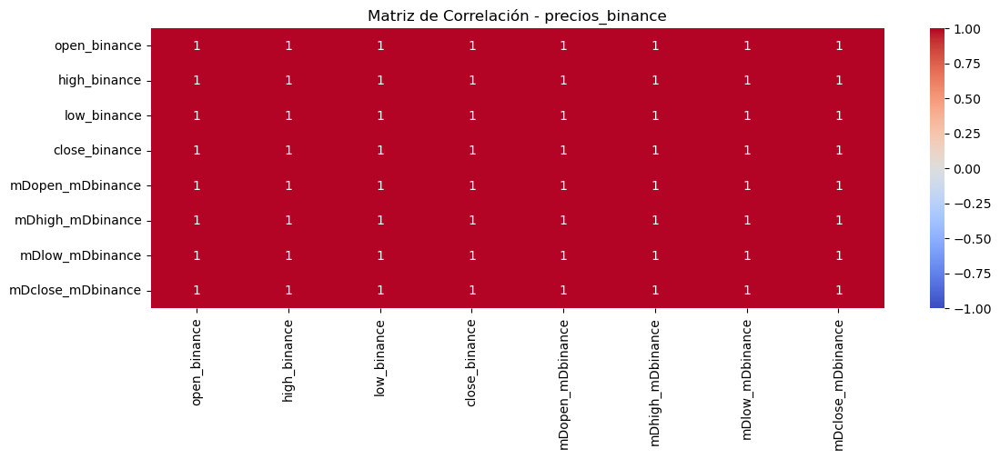

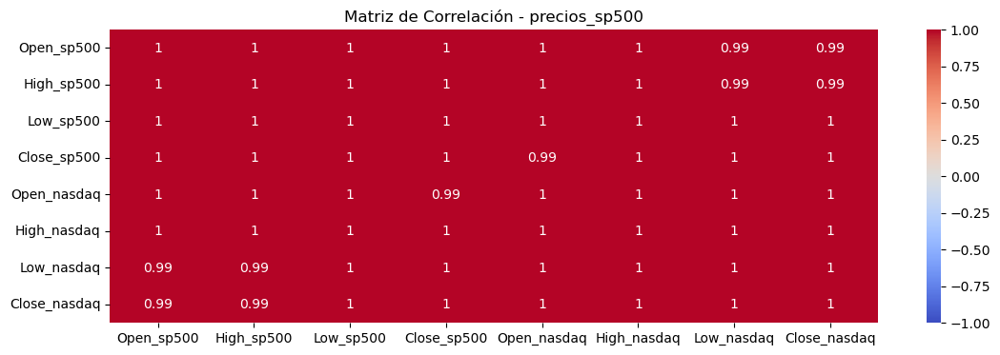

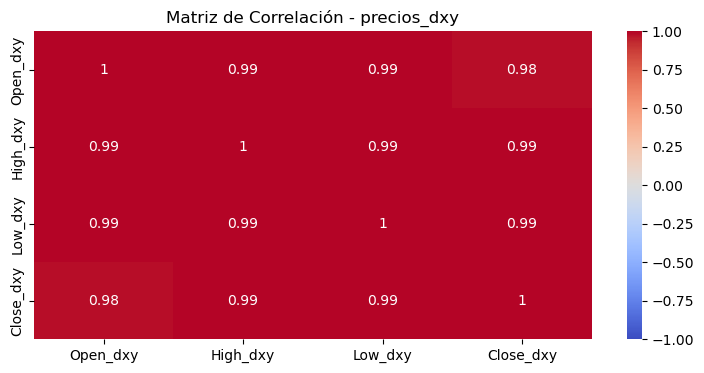

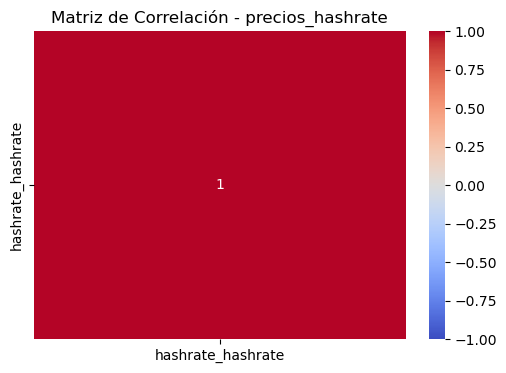

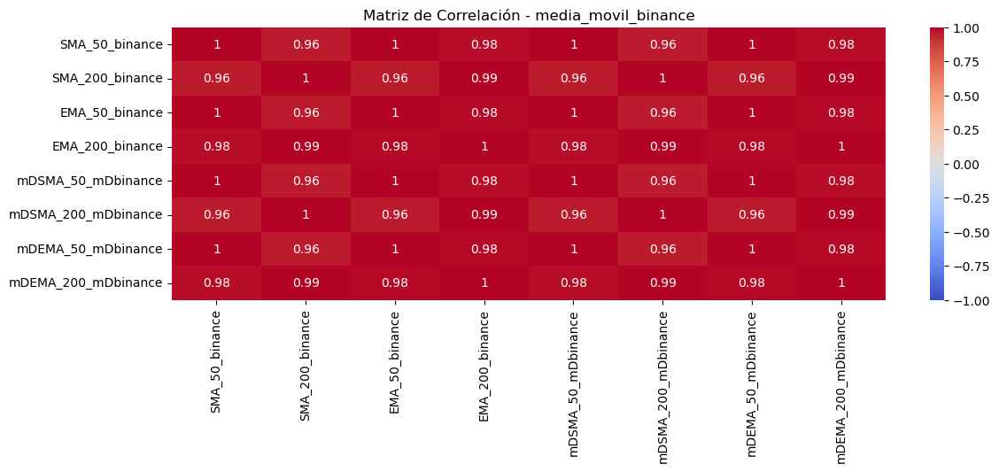

...

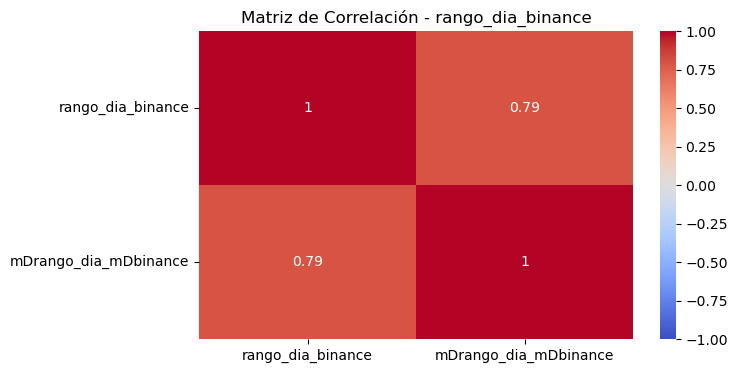

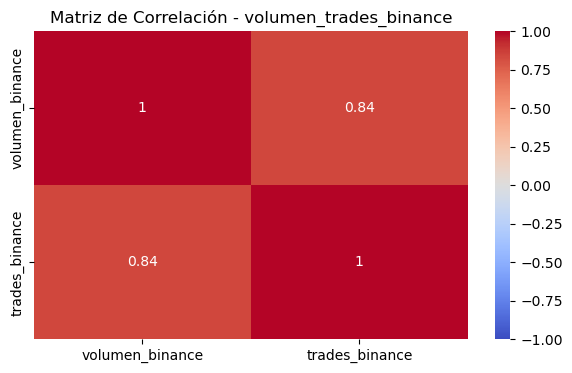

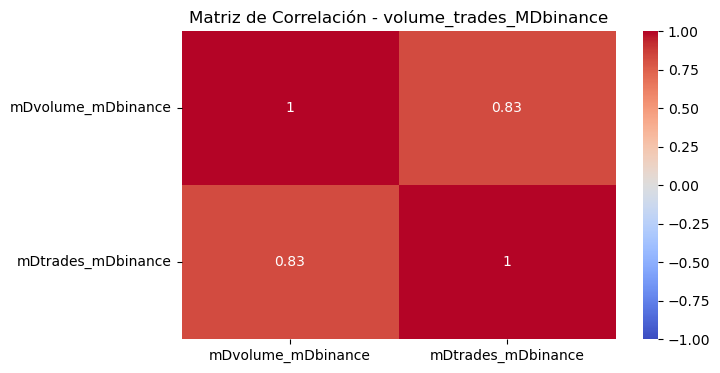

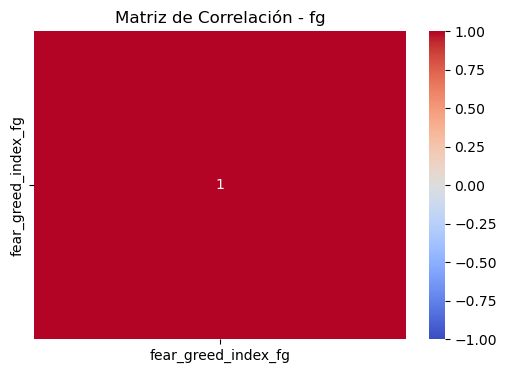

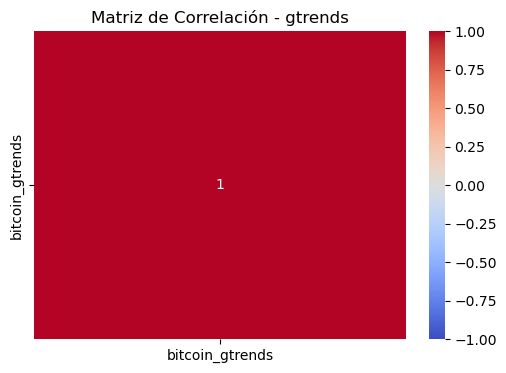

In [7]:

#Comprobación de que los grupos esten correlacionados y contengan informacion similar
for nombre_grupo, variables in grupos.items():
    if all(var in df.columns for var in variables):
        plt.figure(figsize=(5 + len(variables), 4))
        corr_matrix = df[variables].corr()
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title(f"Matriz de Correlación - {nombre_grupo}")
        plt.show()


**Observación**: Una vez definidos los grupos, calculamos las correlaciones dentro de cada uno para comprobar su coherencia. Observamos que las variables están altamente correlacionadas entre sí, lo que confirma que contienen información redundante. Por eso, decidimos mantener solo una variable representativa por grupo, evitando así duplicidados que podrían añadir ruido al modelo.

## Análisis de la correlación a 7 días

**Objetivo del análisis**:
El objetivo principal de este análisis es construir un conjunto de variables explicativas robusto y sin redundancia para predecir la variable objetivo pct_cambio_7d, que representa el cambio porcentual del precio del Bitcoin a 7 días. Para ello, hemos realizado un proceso cuidadoso de selección de variables, eliminando aquellas con alta colinealidad y manteniendo la mayor cantidad posible de información útil y relevante.

### Selección del representante de cada grupo

In [8]:
# Para cada grupo, seleccionar la mejor variable según correlación con el target
cor7 = df.corr(numeric_only=True)['pct_cambio_7d']

variables_a_conservar = []
for grupo, vars_en_grupo in grupos.items():
    # Evitamos grupos que no estén en el DataFrame (por si faltan)
    vars_validas = [v for v in vars_en_grupo if v in df.columns]
    if not vars_validas:
        continue
    # Elegimos la que más se relaciona con pct_cambio_7d
    mejor = max(vars_validas, key=lambda x: abs(cor7.get(x, 0)))
    variables_a_conservar.append(mejor)

# Filtramos solo las columnas seleccionadas + las targets
variables_finales = variables_a_conservar + ['pct_cambio_7d']
variables_finales

['open_binance',
 'High_nasdaq',
 'High_dxy',
 'hashrate_hashrate',
 'SMA_50_binance',
 'SMA_50_nasdaq',
 'SMA_50_dxy',
 'SMA_200_dxy',
 'EMA_200_dxy',
 'momentum_50_binance',
 'momentum_200_binance',
 'momentum_50_nasdaq',
 'momentum_200_sp500',
 'momentum_200_dxy',
 'momentum_50_dxy',
 'volatilidad_50_binance',
 'volatilidad_200_binance',
 'volatilidad_50_sp500',
 'volatilidad_200_nasdaq',
 'volatilidad_50_dxy',
 'volatilidad_200_dxy',
 'RSI_binance',
 'RSI_nasdaq',
 'RSI_dxy',
 'mDvar_diaria_mDbinance',
 'mDrango_dia_mDbinance',
 'volumen_binance',
 'mDvolume_mDbinance',
 'fear_greed_index_fg',
 'bitcoin_gtrends',
 'pct_cambio_7d']

### Visualización de las correlaciones con el nuevo conjunto de variables

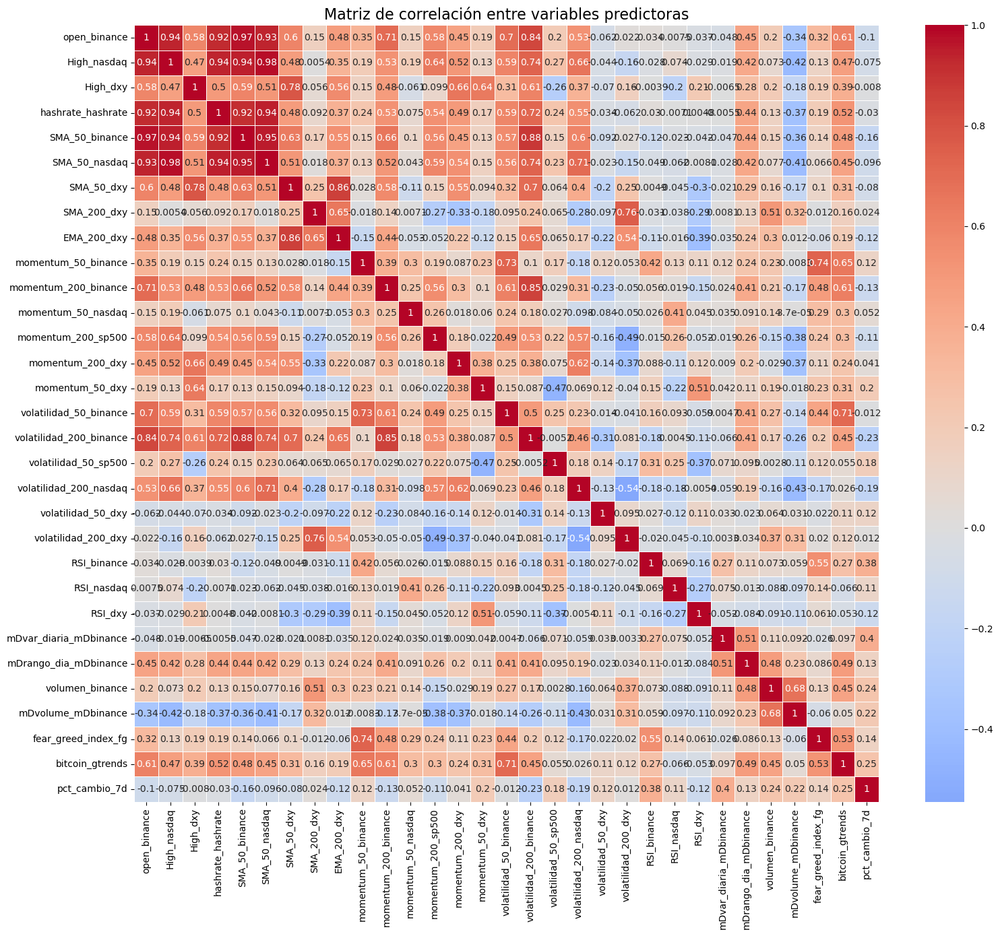

In [9]:
# Calcular matriz de correlación
corr_matrix = df[variables_finales].corr()

# Dibujar heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Matriz de correlación entre variables predictoras', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Análisis**: Una vez definidos los grupos y seleccionadas las variables representativas, observamos una reducción significativa en las correlaciones del conjunto de datos. No obstante, persisten algunas correlaciones elevadas, especialmente entre los precios y las medias móviles del Nasdaq, dxy y del mercado de derivados de Binance. Dado que la media móvil del mercado de derivados muestra la mayor correlación con la variable objetivo, lo cual es coherente, ya que representa directamente el comportamiento del propio Bitcoin, optamos por conservar esta variable y eliminar las demás. Esta decisión nos permitió reducir correlaciones superiores a 0.90 y construir un conjunto de variables más compacto y con menor riesgo de colinealidad.

### Eliminación de las variables altamente correlacionadas

In [10]:
# Variables que quieres eliminar
variables_a_eliminar = ['open_binance', 'High_nasdaq', 'Open_dxy', 'hashrate_hashrate', 'SMA_50_nasdaq']

# Filtrar la lista
nuevas_variables_a_conservar = [var for var in variables_a_conservar if var not in variables_a_eliminar]

# Resultado
print(nuevas_variables_a_conservar)

['High_dxy', 'SMA_50_binance', 'SMA_50_dxy', 'SMA_200_dxy', 'EMA_200_dxy', 'momentum_50_binance', 'momentum_200_binance', 'momentum_50_nasdaq', 'momentum_200_sp500', 'momentum_200_dxy', 'momentum_50_dxy', 'volatilidad_50_binance', 'volatilidad_200_binance', 'volatilidad_50_sp500', 'volatilidad_200_nasdaq', 'volatilidad_50_dxy', 'volatilidad_200_dxy', 'RSI_binance', 'RSI_nasdaq', 'RSI_dxy', 'mDvar_diaria_mDbinance', 'mDrango_dia_mDbinance', 'volumen_binance', 'mDvolume_mDbinance', 'fear_greed_index_fg', 'bitcoin_gtrends']


### Comprobación del VIF

In [17]:
# 1. Subset del DataFrame con esas variables
X = df[nuevas_variables_a_conservar]

# 2. Añadir constante (intercepto)
X_const = sm.add_constant(X)

# 3. Calcular VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i + 1) for i in range(X.shape[1])]

# 4. Ordenar por VIF
vif_data = vif_data.sort_values("VIF", ascending=False)
print(vif_data)

                  Variable        VIF
0                 High_dxy  36.141463
2               SMA_50_dxy  22.027678
8          momentum_50_dxy   9.634733
4      momentum_50_binance   7.607653
9   volatilidad_50_binance   6.704077
1           SMA_50_binance   6.252724
20     fear_greed_index_fg   4.879930
7         momentum_200_dxy   4.751414
18         volumen_binance   4.673274
21         bitcoin_gtrends   4.507011
5     momentum_200_binance   4.485318
11  volatilidad_200_nasdaq   4.247324
19      mDvolume_mDbinance   4.078791
15                 RSI_dxy   3.445678
3              SMA_200_dxy   3.191387
17   mDrango_dia_mDbinance   3.139429
10    volatilidad_50_sp500   2.796104
13             RSI_binance   2.752138
16  mDvar_diaria_mDbinance   2.063250
14              RSI_nasdaq   1.971082
6       momentum_50_nasdaq   1.745738
12      volatilidad_50_dxy   1.588608


**Análisis**: Una vez seleccionadas las variables representativas de cada grupo, procedemos a evaluar la colinealidad entre ellas mediante el cálculo del VIF (Variance Inflation Factor). Observamos que algunos valores eran excesivamente altos, lo que indica redundancia entre variables. Esto resulta especialmente problemático en nuestro caso, ya que al trabajar con múltiples indicadores financieros relacionados con el mercado del Bitcoin, muchas variables tienden a moverse juntas. Si mantenemos variables excesivamente correlacionadas, corremos el riesgo de que el modelo confunda señales redundantes con información relevante, afectando su estabilidad y capacidad para generalizar. Por tanto, aunque todas las variables tienen sentido financiero, su solapamiento puede introducir ruido y dificultar la correcta interpretación del modelo. Por ello, optamos por eliminar progresivamente aquellas con mayor VIF y recalcular, hasta lograr un conjunto más parsimonioso y estadísticamente robusto.



### Eliminación de las variables con mucha colinealidad

**Procedimiento**: Calcular el VIF para detectar colinealidad entre las variables, eliminar aquella con el valor más alto y volver a recalcular. Repetimos este proceso de forma iterativa hasta obtener un conjunto con colinealidad suficientemente baja y estadísticamente estable.  

In [18]:
# Variables que quieres eliminar
variables_a_eliminar = ['EMA_200_dxy', 'momentum_200_sp500', 'volatilidad_200_binance', 'volatilidad_200_dxy']

# Filtrar la lista
nuevas_variables_a_conservar = [var for var in nuevas_variables_a_conservar if var not in variables_a_eliminar]

# Resultado
print(nuevas_variables_a_conservar)

['High_dxy', 'SMA_50_binance', 'SMA_50_dxy', 'SMA_200_dxy', 'momentum_50_binance', 'momentum_200_binance', 'momentum_50_nasdaq', 'momentum_200_dxy', 'momentum_50_dxy', 'volatilidad_50_binance', 'volatilidad_50_sp500', 'volatilidad_200_nasdaq', 'volatilidad_50_dxy', 'RSI_binance', 'RSI_nasdaq', 'RSI_dxy', 'mDvar_diaria_mDbinance', 'mDrango_dia_mDbinance', 'volumen_binance', 'mDvolume_mDbinance', 'fear_greed_index_fg', 'bitcoin_gtrends']


### Análisis del resultado

In [19]:
# 1. Subset del DataFrame con esas variables
X = df[nuevas_variables_a_conservar]

# 2. Añadir constante (intercepto)
X_const = sm.add_constant(X)

# 3. Calcular VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i + 1) for i in range(X.shape[1])]

# 4. Ordenar por VIF
vif_data = vif_data.sort_values("VIF", ascending=False)
print(vif_data)

                  Variable        VIF
0                 High_dxy  36.141463
2               SMA_50_dxy  22.027678
8          momentum_50_dxy   9.634733
4      momentum_50_binance   7.607653
9   volatilidad_50_binance   6.704077
1           SMA_50_binance   6.252724
20     fear_greed_index_fg   4.879930
7         momentum_200_dxy   4.751414
18         volumen_binance   4.673274
21         bitcoin_gtrends   4.507011
5     momentum_200_binance   4.485318
11  volatilidad_200_nasdaq   4.247324
19      mDvolume_mDbinance   4.078791
15                 RSI_dxy   3.445678
3              SMA_200_dxy   3.191387
17   mDrango_dia_mDbinance   3.139429
10    volatilidad_50_sp500   2.796104
13             RSI_binance   2.752138
16  mDvar_diaria_mDbinance   2.063250
14              RSI_nasdaq   1.971082
6       momentum_50_nasdaq   1.745738
12      volatilidad_50_dxy   1.588608


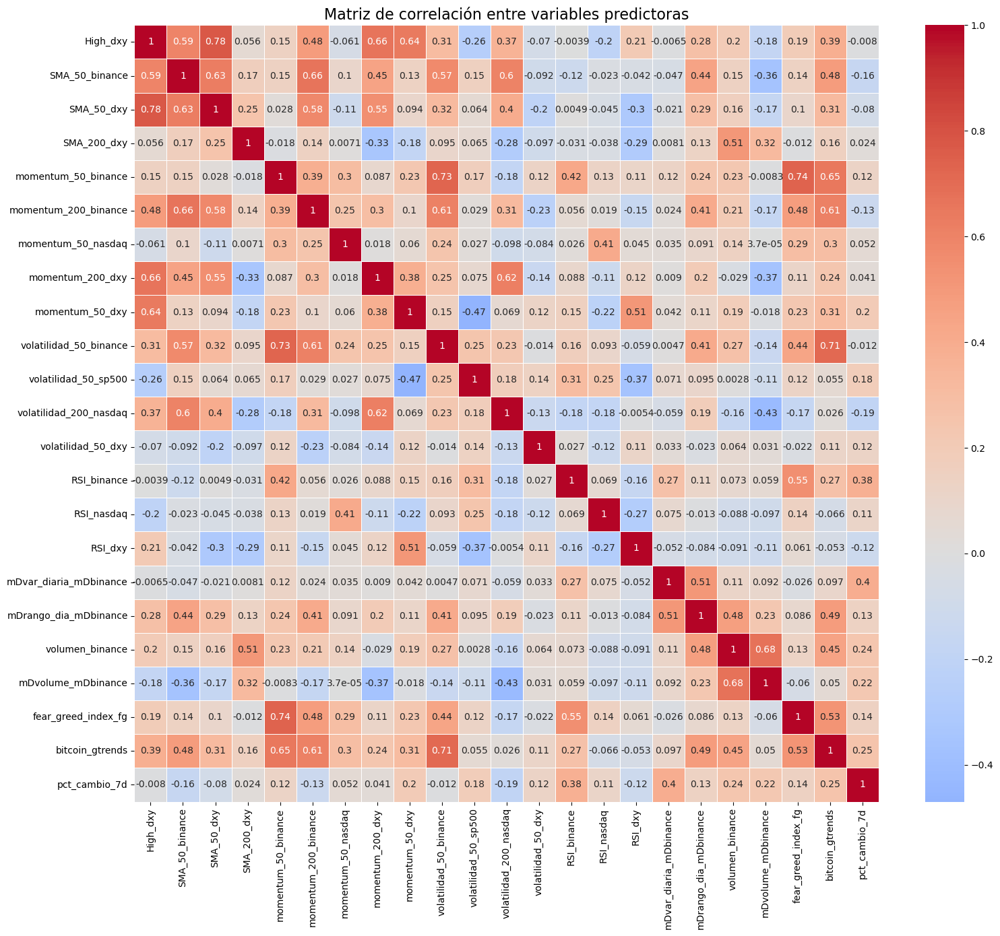

In [20]:
# Calcular matriz de correlación
corr_matrix = df[nuevas_variables_a_conservar + ['pct_cambio_7d']].corr()

# Dibujar heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Matriz de correlación entre variables predictoras', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Conclusión**: Tras aplicar el proceso de selección, el conjunto final de variables muestra una estructura más depurada: la colinealidad se ha reducido notablemente, como refleja la matriz de correlación, y los valores de VIF han bajado a rangos más razonables. Si bien algunos siguen siendo relativamente altos, esto se debe en gran parte a la naturaleza de los datos financieros, donde muchas variables comparten relaciones estructurales. Aun así, el enfoque seguido ha permitido conservar la riqueza informativa, minimizando redundancias sin perder representatividad.

## Analisis de la correlación a 30 días

**Objetivo del análisis**: El objetivo principal de este análisis es construir un conjunto de variables explicativas robusto y sin redundancia para predecir la variable objetivo pct_cambio_30d, que representa el cambio porcentual del precio del Bitcoin a 30 días. Para ello, hemos realizado un proceso cuidadoso de selección de variables, eliminando aquellas con alta colinealidad y manteniendo la mayor cantidad posible de información útil y relevante.

### Selección del representante de cada grupo

In [21]:
# Para cada grupo, seleccionar la mejor variable según correlación con el target
cor7 = df.corr(numeric_only=True)['pct_cambio_30d']

variables_a_conservar = []
for grupo, vars_en_grupo in grupos.items():
    # Evitamos grupos que no estén en el DataFrame (por si faltan)
    vars_validas = [v for v in vars_en_grupo if v in df.columns]
    if not vars_validas:
        continue
    # Elegimos la que más se relaciona con pct_cambio_7d
    mejor = max(vars_validas, key=lambda x: abs(cor7.get(x, 0)))
    variables_a_conservar.append(mejor)

# Filtramos solo las columnas seleccionadas + las targets
variables_finales = variables_a_conservar + ['pct_cambio_30d']
variables_finales

['open_binance',
 'High_nasdaq',
 'Close_dxy',
 'hashrate_hashrate',
 'SMA_50_binance',
 'SMA_50_nasdaq',
 'SMA_50_dxy',
 'SMA_200_dxy',
 'EMA_200_dxy',
 'mDmomentum_50_mDbinance',
 'momentum_200_binance',
 'momentum_50_sp500',
 'momentum_200_sp500',
 'momentum_200_dxy',
 'momentum_50_dxy',
 'mDvolatilidad_50_mDbinance',
 'volatilidad_200_binance',
 'volatilidad_50_sp500',
 'volatilidad_200_nasdaq',
 'volatilidad_50_dxy',
 'volatilidad_200_dxy',
 'RSI_binance',
 'RSI_nasdaq',
 'RSI_dxy',
 'mDvar_diaria_mDbinance',
 'rango_dia_binance',
 'volumen_binance',
 'mDvolume_mDbinance',
 'fear_greed_index_fg',
 'bitcoin_gtrends',
 'pct_cambio_30d']

### Visualizacion de las correlaciones con el nuevo conjunto de variables

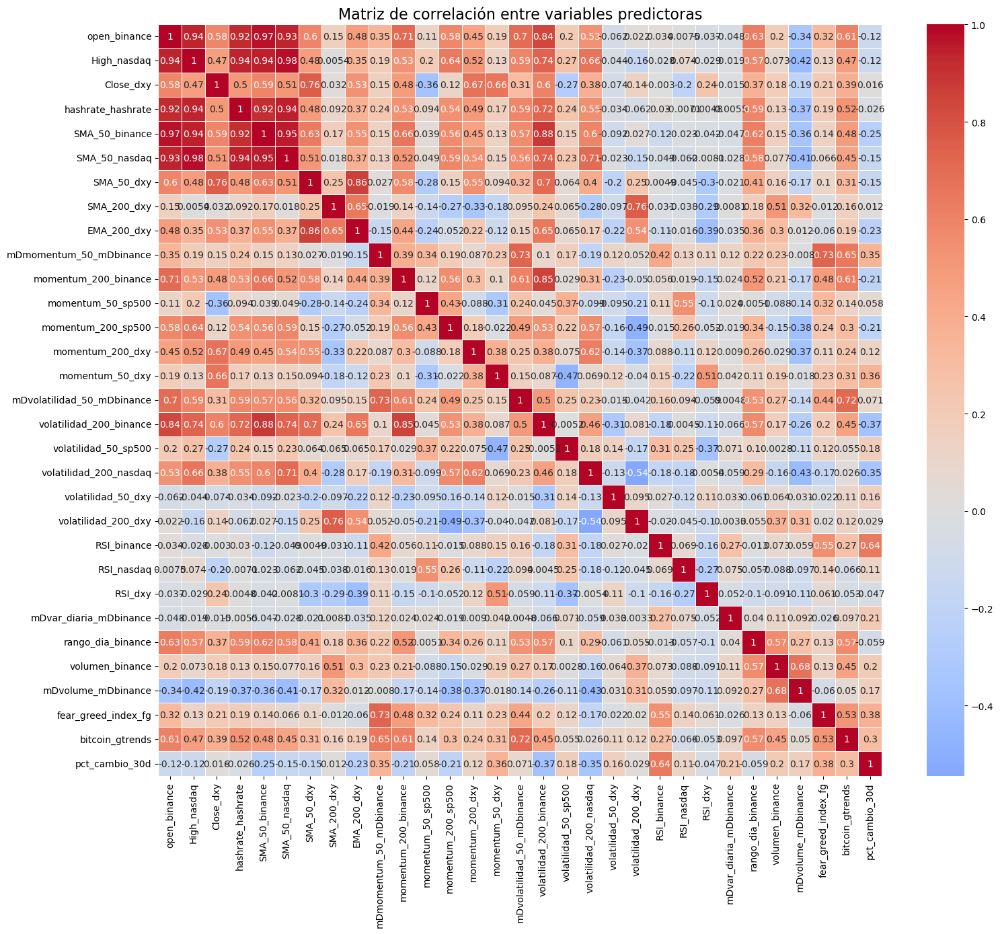

In [22]:
# Calcular matriz de correlación
corr_matrix = df[variables_finales].corr()

# Dibujar heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Matriz de correlación entre variables predictoras', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Análisis**: En el modelo con horizonte a 30 días, se observó un patrón de correlaciones muy similar al del modelo a 7 días, con relaciones elevadas entre precios y medias móviles de ciertos mercados como el Nasdaq, el DXY y el mercado de derivados de Binance. Por tanto, se aplicó el mismo procedimiento

### Eliminación de las variables altamente correlacionadas

In [23]:
# Variables que quieres eliminar
variables_a_eliminar = ['open_binance', 'High_nasdaq', 'Open_dxy', 'hashrate_hashrate', 'SMA_50_nasdaq']

# Filtrar la lista
nuevas_variables_a_conservar = [var for var in variables_a_conservar if var not in variables_a_eliminar]

# Resultado
print(nuevas_variables_a_conservar)

['Close_dxy', 'SMA_50_binance', 'SMA_50_dxy', 'SMA_200_dxy', 'EMA_200_dxy', 'mDmomentum_50_mDbinance', 'momentum_200_binance', 'momentum_50_sp500', 'momentum_200_sp500', 'momentum_200_dxy', 'momentum_50_dxy', 'mDvolatilidad_50_mDbinance', 'volatilidad_200_binance', 'volatilidad_50_sp500', 'volatilidad_200_nasdaq', 'volatilidad_50_dxy', 'volatilidad_200_dxy', 'RSI_binance', 'RSI_nasdaq', 'RSI_dxy', 'mDvar_diaria_mDbinance', 'rango_dia_binance', 'volumen_binance', 'mDvolume_mDbinance', 'fear_greed_index_fg', 'bitcoin_gtrends']


### Comprobación del VIF

In [28]:
# 1. Subset del DataFrame con esas variables
X = df[nuevas_variables_a_conservar]

# 2. Añadir constante (intercepto)
X_const = sm.add_constant(X)

# 3. Calcular VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i + 1) for i in range(X.shape[1])]

# 4. Ordenar por VIF
vif_data = vif_data.sort_values("VIF", ascending=False)
print(vif_data)

                      Variable        VIF
0                    Close_dxy  41.631623
2                   SMA_50_dxy  25.075666
8              momentum_50_dxy  11.963325
4      mDmomentum_50_mDbinance   7.741793
1               SMA_50_binance   7.144064
9   mDvolatilidad_50_mDbinance   6.859822
20         fear_greed_index_fg   4.939141
18             volumen_binance   4.808114
7             momentum_200_dxy   4.740489
21             bitcoin_gtrends   4.477055
19          mDvolume_mDbinance   4.460246
5         momentum_200_binance   4.339271
11      volatilidad_200_nasdaq   4.252400
15                     RSI_dxy   3.958385
17           rango_dia_binance   3.906527
3                  SMA_200_dxy   3.302547
6            momentum_50_sp500   2.897064
10        volatilidad_50_sp500   2.842048
13                 RSI_binance   2.778123
14                  RSI_nasdaq   2.030045
12          volatilidad_50_dxy   1.634388
16      mDvar_diaria_mDbinance   1.355773


**Análisis**: De nuevo, al igual que con 7 días, se pueden observar coeficientes excesivamente altos. Por ello, realizamos el mismo proceso para tratar de reducirlo.

### Eliminación de las variables con alta colinealidad

In [29]:
# Variables que quieres eliminar
variables_a_eliminar = ['EMA_200_dxy', 'volatilidad_200_binance', 'volatilidad_200_dxy', 'momentum_200_sp500']

# Filtrar la lista
nuevas_variables_a_conservar = [var for var in nuevas_variables_a_conservar if var not in variables_a_eliminar]

# Resultado
print(nuevas_variables_a_conservar)

['Close_dxy', 'SMA_50_binance', 'SMA_50_dxy', 'SMA_200_dxy', 'mDmomentum_50_mDbinance', 'momentum_200_binance', 'momentum_50_sp500', 'momentum_200_dxy', 'momentum_50_dxy', 'mDvolatilidad_50_mDbinance', 'volatilidad_50_sp500', 'volatilidad_200_nasdaq', 'volatilidad_50_dxy', 'RSI_binance', 'RSI_nasdaq', 'RSI_dxy', 'mDvar_diaria_mDbinance', 'rango_dia_binance', 'volumen_binance', 'mDvolume_mDbinance', 'fear_greed_index_fg', 'bitcoin_gtrends']


### Análisis del resultado

In [30]:
# 1. Subset del DataFrame con esas variables
X = df[nuevas_variables_a_conservar]

# 2. Añadir constante (intercepto)
X_const = sm.add_constant(X)

# 3. Calcular VIF
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X_const.values, i + 1) for i in range(X.shape[1])]

# 4. Ordenar por VIF
vif_data = vif_data.sort_values("VIF", ascending=False)
print(vif_data)

                      Variable        VIF
0                    Close_dxy  41.631623
2                   SMA_50_dxy  25.075666
8              momentum_50_dxy  11.963325
4      mDmomentum_50_mDbinance   7.741793
1               SMA_50_binance   7.144064
9   mDvolatilidad_50_mDbinance   6.859822
20         fear_greed_index_fg   4.939141
18             volumen_binance   4.808114
7             momentum_200_dxy   4.740489
21             bitcoin_gtrends   4.477055
19          mDvolume_mDbinance   4.460246
5         momentum_200_binance   4.339271
11      volatilidad_200_nasdaq   4.252400
15                     RSI_dxy   3.958385
17           rango_dia_binance   3.906527
3                  SMA_200_dxy   3.302547
6            momentum_50_sp500   2.897064
10        volatilidad_50_sp500   2.842048
13                 RSI_binance   2.778123
14                  RSI_nasdaq   2.030045
12          volatilidad_50_dxy   1.634388
16      mDvar_diaria_mDbinance   1.355773


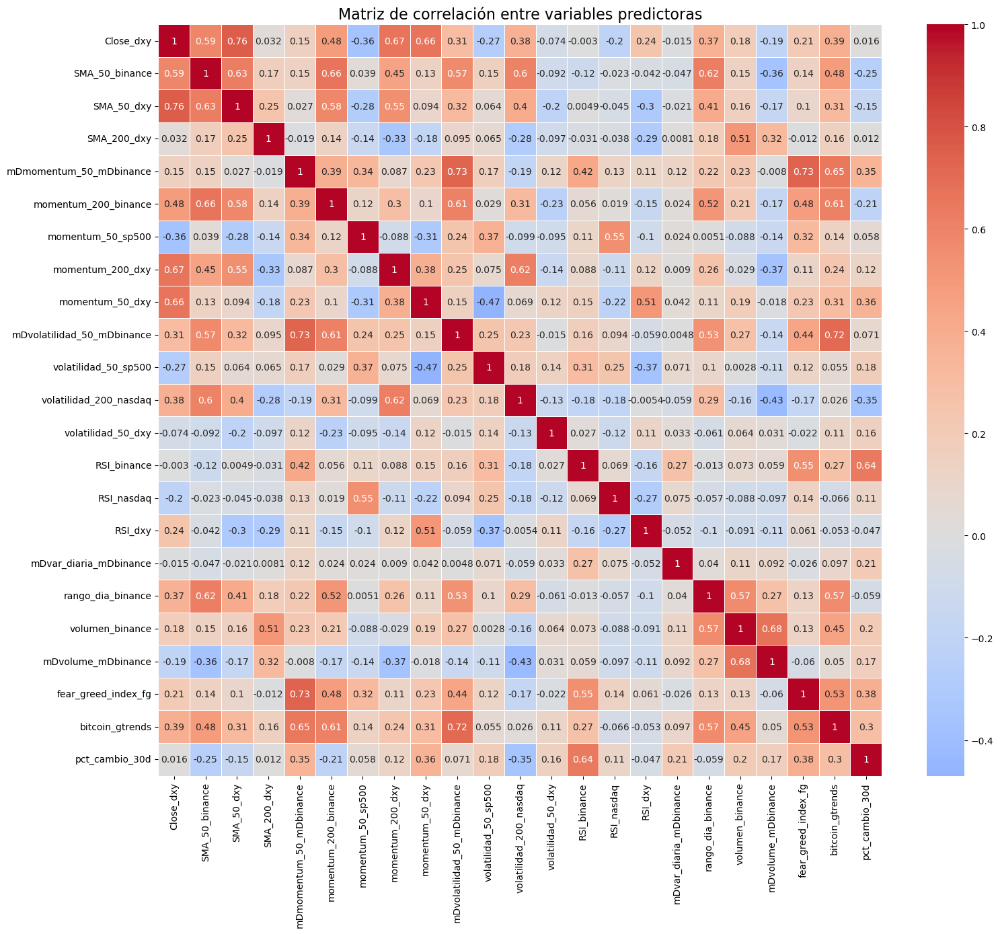

In [31]:
# Calcular matriz de correlación
corr_matrix = df[nuevas_variables_a_conservar + ['pct_cambio_30d']].corr()

# Dibujar heatmap
plt.figure(figsize=(16, 14))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, linewidths=0.5)
plt.title('Matriz de correlación entre variables predictoras', fontsize=16)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

**Conclusión**: Al igual que en el caso del horizonte de 7 días, la estrategia de agrupamiento y selección de variables permitió reducir de forma efectiva la colinealidad y conservar las variables más informativas. Aunque los conjuntos de variables resultantes son similares entre los dos horizontes, se observan ligeras diferencias. Esto tiene sentido desde una perspectiva financiera, ya que el comportamiento del mercado y el impacto de ciertos indicadores pueden variar dependiendo del plazo. Variables como el RSI del Nasdaq o el número de transacciones tienden a capturar dinámicas más prolongadas y podrían tener mayor influencia en ventanas de 30 días